原创教程，版权所有。

同济子豪兄B站视频专栏：https://space.bilibili.com/1900783

玩转UCI心脏病二分类数据集，课件、代码、答疑互动：https://t.zsxq.com/Z7yNZBu

子豪兄Python交流QQ群：1077638784

子豪兄Kaggle数据科学竞赛交流：481041896

微信公众号：人工智能小技巧

2020-05-15


# 本节概述

预处理数据之后，将数据集的特征和标签分别取出，并划分构建训练集、测试集。

构建随机森林分类模型，在训练集上训练。

可视化单个决策树基模型，分析特征权重。

# 导入工具包，预处理后的数据集

In [1]:
# 运行本代码，忽略烦人的红色提示
import warnings
warnings.filterwarnings("ignore")

In [2]:
# 运行本代码，忽略烦人的红色提示
import warnings
warnings.filterwarnings("ignore")

In [3]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

df = pd.read_csv('process_heart.csv')

# 查看预处理后的数据集

In [4]:
df.shape

(303, 27)

In [5]:
df.head()

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,target,sex_female,sex_male,chest_pain_type_asymptomatic,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
0,63,145,233,150,2.3,0,1,0,1,1,...,1,1,0,0,0,1,0,1,0,0
1,37,130,250,187,3.5,0,1,0,1,0,...,0,1,0,0,0,1,1,0,0,0
2,41,130,204,172,1.4,0,1,1,0,0,...,1,1,0,1,0,0,1,0,0,0
3,56,120,236,178,0.8,0,1,0,1,0,...,0,1,0,1,0,0,1,0,0,0
4,57,120,354,163,0.6,0,1,1,0,0,...,0,0,1,1,0,0,1,0,0,0


# 划分特征列和标签列

In [6]:
X = df.drop('target',axis=1)

In [7]:
X.shape

(303, 26)

In [8]:
y = df['target']

In [9]:
y.shape

(303,)

In [10]:
y

0      1
1      1
2      1
3      1
4      1
      ..
298    0
299    0
300    0
301    0
302    0
Name: target, Length: 303, dtype: int64

# 划分训练集和测试集

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [12]:
X_train.shape

(242, 26)

In [13]:
X_test.shape

(61, 26)

In [14]:
y_train.shape

(242,)

In [15]:
y_test.shape

(61,)

In [16]:
X_test.head()

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,sex_female,sex_male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
246,56,134,409,150,1.9,2,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0
183,58,112,230,165,2.5,1,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0
229,64,125,309,131,1.8,0,0,1,0,0,...,0,0,1,0,1,0,0,0,1,0
126,47,112,204,143,0.1,0,0,1,0,0,...,0,1,0,1,0,0,1,0,0,0
184,50,150,243,128,2.6,0,0,1,0,0,...,1,1,0,0,1,0,0,0,1,0


# K-Fold Cross Validation

In [17]:
# K-fold cross validation
def k_fold(data, label, current_fold, total_fold, total_sample_size):
    #TODO
    start = np.floor(current_fold/total_fold*total_sample_size).astype('int')
    end = np.floor((current_fold+1)/total_fold*total_sample_size).astype('int')
    data_test = data[start:end]
    label_test = label[start:end]
    data_test.index = list(range(len(data_test)))
    label_test.index = list(range(len(data_test)))
    data_train = pd.concat([data[0:start+1],data[end:]])
    label_train = pd.concat([label[0:start+1],label[end:]])
    return data_train, data_test, label_train, label_test


# accuracy
def Accuracy(data_test, data_predict):
    ac_d = (sum(data_test + data_predict == 2)/sum(data_test == 1))
    ac_h = (sum(data_test + data_predict == 0)/sum(data_test == 0))
    if ac_d:
        if ac_h:
            result = (ac_d + ac_h)/2
        else:
            result = ac_d/2
    else:
        if ac_h:
            result = ac_h/2
        else:
            result = 0
    return round(result,2)


def k_fold_cross_validation(X_train, y_train, K, model):
    K = 4
    acc = []
    for current_fold in range(K):
        data_train, data_test, label_train, label_test = k_fold(X_train, y_train,current_fold, K, len(X_train))
        model.fit(data_train, label_train)
        predict = model.predict(data_test)
        accuracy = Accuracy(label_test, predict)
        acc.append(accuracy)
    accuracy = np.mean(acc)
    return accuracy

# Logistic Regrssion Model

## Whole Variables

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [19]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [20]:
index = X_train.columns
coef = log_reg.coef_
Coef_df = pd.DataFrame(coef, columns = index)
Coef_df

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,sex_female,sex_male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
0,0.012679,-0.015564,-0.006226,0.028364,-0.207352,-0.998668,0.722739,-0.687829,0.302915,0.137136,...,-0.121154,0.371702,-0.336793,0.470202,-0.464696,0.029403,0.520149,0.03193,-0.449013,-0.068156


In [21]:
y_pred_log = log_reg.predict(X_test)
y_pred_proba_log = log_reg.predict_proba(X_test)

In [22]:
import itertools
def cnf_matrix_plotter(cm, classes):
    # plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Oranges)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    threshold = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > threshold else "black",
                 fontsize=25)

    plt.tight_layout()
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

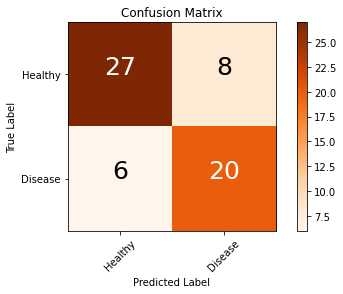

In [23]:
confusion_matrix_model = confusion_matrix(y_test, y_pred_log)
cnf_matrix_plotter(confusion_matrix_model, ['Healthy','Disease'])

In [24]:
print(classification_report(y_test, y_pred_log, target_names=['Healthy','Disease']))

              precision    recall  f1-score   support

     Healthy       0.82      0.77      0.79        35
     Disease       0.71      0.77      0.74        26

    accuracy                           0.77        61
   macro avg       0.77      0.77      0.77        61
weighted avg       0.77      0.77      0.77        61



## Best Variable combination for Logistic Regression

In [26]:
K = 4
variables = X_train.columns 
i = 0
var = [variables[0]]
max_acc = 0
var_ref = list(variables)
while i< len(var_ref):
    acc = 0
    for k,j in enumerate(var_ref):
        temp = var.copy()
        temp[i] = j
        a = k_fold_cross_validation(X_train[temp], y_train, K,log_reg)
        if a> acc:
            var[i] = j
            acc = a 
            posi = k
    if max_acc > acc:
        break
    else:
        max_acc = acc
    var_ref.pop(posi)
    
    if var_ref:
        var.append(var_ref[0])
    else:
        break
    i += 1
#     print(1)
print("best variable combination:",var)
        
    

best variable combination: ['chest_pain_type_typical angina', 'max_heart_rate_achieved', 'num_major_vessels', 'thalassemia_fixed defect', 'rest_ecg_ST-T wave abnormality', 'resting_blood_pressure', 'chest_pain_type_atypical angina', 'age', 'rest_ecg_left ventricular hypertrophy']


In [27]:
log_reg_best = LogisticRegression()
log_reg_best.fit(X_train[var], y_train)
coef = log_reg_best.coef_
Coef_df = pd.DataFrame(coef, columns = var)
Coef_df

,chest_pain_type_typical angina,max_heart_rate_achieved,num_major_vessels,thalassemia_fixed defect,rest_ecg_ST-T wave abnormality,resting_blood_pressure,chest_pain_type_atypical angina,age,rest_ecg_left ventricular hypertrophy
0,-1.781067,0.024406,-0.942977,1.457285,0.460093,-0.019465,0.000146,-0.001895,0.005158


In [28]:
y_pred_log_best = log_reg_best.predict(X_test[var])
y_pred_proba_log_best = log_reg_best.predict_proba(X_test[var])

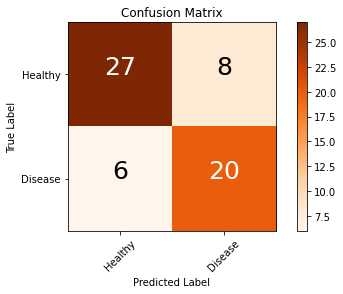

In [29]:
confusion_matrix_model_best = confusion_matrix(y_test, y_pred_log_best)
cnf_matrix_plotter(confusion_matrix_model_best, ['Healthy','Disease'])

In [30]:
print(classification_report(y_test, y_pred_log_best, target_names=['Healthy','Disease']))

              precision    recall  f1-score   support

     Healthy       0.82      0.77      0.79        35
     Disease       0.71      0.77      0.74        26

    accuracy                           0.77        61
   macro avg       0.77      0.77      0.77        61
weighted avg       0.77      0.77      0.77        61



# Perceptron Learning Algorithm

## Whole Variables

In [31]:
from sklearn.linear_model import Perceptron

In [32]:
PLA_reg = Perceptron()
PLA_reg.fit(X_train, y_train)

Perceptron(alpha=0.0001, class_weight=None, early_stopping=False, eta0=1.0,
           fit_intercept=True, max_iter=1000, n_iter_no_change=5, n_jobs=None,
           penalty=None, random_state=0, shuffle=True, tol=0.001,
           validation_fraction=0.1, verbose=0, warm_start=False)

In [33]:
index = X_train.columns
coef = PLA_reg.coef_
Coef_df = pd.DataFrame(coef, columns = index)
Coef_df

,age,resting_blood_pressure,cholesterol,max_heart_rate_achieved,st_depression,num_major_vessels,sex_female,sex_male,chest_pain_type_asymptomatic,chest_pain_type_atypical angina,...,rest_ecg_normal,exercise_induced_angina_no,exercise_induced_angina_yes,st_slope_downsloping,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect,thalassemia_unknown
0,-801.0,-857.0,-150.0,1132.0,-429.3,-467.0,220.0,-231.0,26.0,80.0,...,-57.0,185.0,-196.0,178.0,-168.0,-21.0,255.0,-27.0,-236.0,-3.0


In [34]:
y_pred_PLA = PLA_reg.predict(X_test)

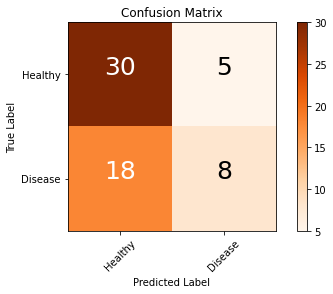

              precision    recall  f1-score   support

     Healthy       0.62      0.86      0.72        35
     Disease       0.62      0.31      0.41        26

    accuracy                           0.62        61
   macro avg       0.62      0.58      0.57        61
weighted avg       0.62      0.62      0.59        61



In [35]:
confusion_matrix_model = confusion_matrix(y_test, y_pred_PLA)
cnf_matrix_plotter(confusion_matrix_model, ['Healthy','Disease'])
print(classification_report(y_test, y_pred_PLA, target_names=['Healthy','Disease']))

## Best Variable combination for PLA Regression¶

In [37]:
variables = X_train.columns 
acc = 0
var = []
for x in range(len(variables)):
    max_acc = acc
    for i in itertools.combinations(variables, x + 1):
        a = k_fold_cross_validation(X_train[list(i)], y_train, 4,PLA_reg)
        if a> acc:
            var = list(i).copy()
            acc = a
    print(var, acc, max_acc)
    if acc - max_acc < 4*10**(-2):
        break
print("best variable combination:",var)       
        

['num_major_vessels'] 0.675 0
['chest_pain_type_typical angina', 'exercise_induced_angina_no'] 0.7775000000000001 0.675
['num_major_vessels', 'sex_female', 'chest_pain_type_typical angina'] 0.805 0.7775000000000001
best variable combination: ['num_major_vessels', 'sex_female', 'chest_pain_type_typical angina']


In [38]:
PLA_reg_best = Perceptron()
PLA_reg_best.fit(X_train[var], y_train)

Perceptron(alpha=0.0001, class_weight=None, early_stopping=False, eta0=1.0,
           fit_intercept=True, max_iter=1000, n_iter_no_change=5, n_jobs=None,
           penalty=None, random_state=0, shuffle=True, tol=0.001,
           validation_fraction=0.1, verbose=0, warm_start=False)

In [39]:
coef = PLA_reg_best.coef_
Coef_df = pd.DataFrame(coef, columns = var)
Coef_df

,num_major_vessels,sex_female,chest_pain_type_typical angina
0,1.0,2.0,-3.0


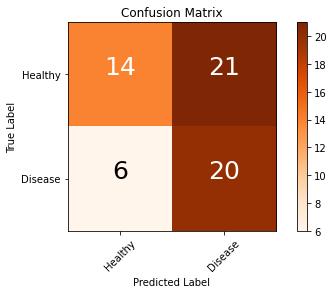

              precision    recall  f1-score   support

     Healthy       0.70      0.40      0.51        35
     Disease       0.49      0.77      0.60        26

    accuracy                           0.56        61
   macro avg       0.59      0.58      0.55        61
weighted avg       0.61      0.56      0.55        61



In [40]:
y_pred_PLA_best = PLA_reg_best.predict(X_test[var])
confusion_matrix_model_best = confusion_matrix(y_test, y_pred_PLA_best)
cnf_matrix_plotter(confusion_matrix_model_best, ['Healthy','Disease'])
print(classification_report(y_test, y_pred_PLA_best, target_names=['Healthy','Disease']))

# Decision Tree

In [41]:
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [42]:
y_pred_tree = tree.predict(X_test)

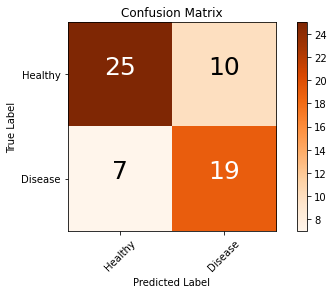

              precision    recall  f1-score   support

     Healthy       0.78      0.71      0.75        35
     Disease       0.66      0.73      0.69        26

    accuracy                           0.72        61
   macro avg       0.72      0.72      0.72        61
weighted avg       0.73      0.72      0.72        61



In [43]:
confusion_matrix_model = confusion_matrix(y_test, y_pred_tree)
cnf_matrix_plotter(confusion_matrix_model, ['Healthy','Disease'])
print(classification_report(y_test, y_pred_tree, target_names=['Healthy','Disease']))

In [45]:
feature_names = X_train.columns
y_train_str = y_train.astype('str')
y_train_str[y_train_str == '0'] = 'no disease'
y_train_str[y_train_str == '1'] = 'disease'
y_train_str = y_train_str.values

from sklearn.tree import export_graphviz
export_graphviz(tree, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = y_train_str,
                rounded = True, proportion = True, 
                label='root',
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree1.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree1.png')

# Random Forest

In [46]:
from sklearn.ensemble import RandomForestClassifier

In [47]:
model = RandomForestClassifier(max_depth=5, n_estimators=100, random_state=5)
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=5, verbose=0,
                       warm_start=False)

## 可视化随机森林中的一颗决策树

In [48]:
len(model.estimators_)

100

In [49]:
# 指定索引为7的决策树
estimator = model.estimators_[7]

In [50]:
estimator

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=2059200585, splitter='best')

In [51]:
# 将特征值转为字符串
feature_names = X_train.columns
y_train_str = y_train.astype('str')
y_train_str[y_train_str == '0'] = 'no disease'
y_train_str[y_train_str == '1'] = 'disease'
y_train_str = y_train_str.values

In [52]:
from sklearn.tree import export_graphviz
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = y_train_str,
                rounded = True, proportion = True, 
                label='root',
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

In [61]:
# import eli5
# eli5.show_weights(estimator,feature_names=feature_names.to_list())

参考博客：

scikit-learn决策树算法类库介绍
https://www.cnblogs.com/pinard/p/6056319.html

## Feature Importance

In [59]:
model.feature_importances_

array([0.05614043, 0.04827184, 0.04407129, 0.08853471, 0.08467226,
       0.14020655, 0.02749492, 0.02202319, 0.0098385 , 0.00767497,
       0.02349542, 0.1477068 , 0.00561248, 0.00691582, 0.00972928,
       0.00072171, 0.01042145, 0.03575505, 0.04107245, 0.03384032,
       0.02449912, 0.00315107, 0.06898662, 0.00388003, 0.05441833,
       0.00086539])

In [60]:
print('特征排序：')
feature_names = X_test.columns
feature_importances = model.feature_importances_
indices = np.argsort(feature_importances)[::-1]

for index in indices:
    print("feature %s (%f)" %(feature_names[index], feature_importances[index]))

特征排序：
feature chest_pain_type_typical angina (0.147707)
feature num_major_vessels (0.140207)
feature max_heart_rate_achieved (0.088535)
feature st_depression (0.084672)
feature thalassemia_fixed defect (0.068987)
feature age (0.056140)
feature thalassemia_reversable defect (0.054418)
feature resting_blood_pressure (0.048272)
feature cholesterol (0.044071)
feature exercise_induced_angina_yes (0.041072)
feature exercise_induced_angina_no (0.035755)
feature st_slope_downsloping (0.033840)
feature sex_female (0.027495)
feature st_slope_flat (0.024499)
feature chest_pain_type_non-anginal pain (0.023495)
feature sex_male (0.022023)
feature rest_ecg_normal (0.010421)
feature chest_pain_type_asymptomatic (0.009839)
feature rest_ecg_ST-T wave abnormality (0.009729)
feature chest_pain_type_atypical angina (0.007675)
feature fasting_blood_sugar_lower than 120mg/ml (0.006916)
feature fasting_blood_sugar_greater than 120mg/ml (0.005612)
feature thalassemia_normal (0.003880)
feature st_slope_upslopi

In [64]:
# import eli5
# eli5.show_weights(model,feature_names=feature_names.to_list())

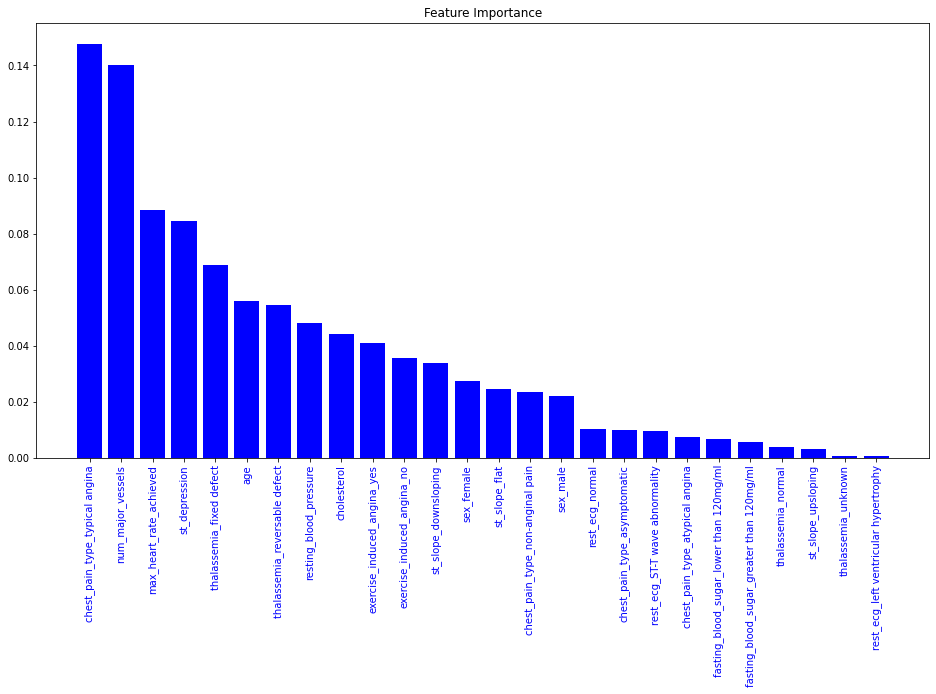

In [63]:
plt.figure(figsize=(16,8))
plt.title("Feature Importance")
plt.bar(range(len(feature_importances)), feature_importances[indices], color='b')
plt.xticks(range(len(feature_importances)), np.array(feature_names)[indices], color='b', rotation=90)
plt.show()

## Shap

In [65]:
## ! pip install shap
import shap
shap.initjs()

In [66]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [73]:
y_base = explainer.expected_value

array([0.42483471, 0.57516529])

The prediction of health status $y_i$ can be calculate in this way:

$y_i = y_{base} + f(x_{i,1} + f(x_{i,2} + ... + f(x_{i,26})$

* y_base shows that for patient they have a 0.5751(>0.5) base probability to be test as having heart probelm. For healthy people they also have 0.4248(<0.5) base probability to be test as unhealthy. This seems reasonable, and both of them are very close to 0.5. So it's important to have effective variables has positive shap value on patients and negative shap value on healthy people.

In [88]:
j = 9
health_explainer = pd.DataFrame()
health_explainer['feature'] = X_test.columns
health_explainer['feature_value'] = X_test[X_test.columns].iloc[j].values
health_explainer['shap_value'] = shap_values[1][j]
health_explainer

,feature,feature_value,shap_value
0,age,40.0,0.007323
1,resting_blood_pressure,110.0,0.030751
2,cholesterol,167.0,0.010413
3,max_heart_rate_achieved,114.0,-0.058779
4,st_depression,2.0,-0.059074
5,num_major_vessels,0.0,0.084856
6,sex_female,0.0,-0.013141
7,sex_male,1.0,-0.009548
8,chest_pain_type_asymptomatic,0.0,-0.002459
9,chest_pain_type_atypical angina,0.0,-0.001221


In [93]:
print("Prediction for the number",j,"people, he/she has",\
      (sum(shap_values[1][j]) + explainer.expected_value[1]),\
      "probabilty to have heart problem.")
print("The really health status of number",j,"people is",y_test.iloc[j])

Prediction for the number 9 people, he/she has 0.20294690133138293 probabilty to have heart problem.
The really health status of number 9 people is 0


### Now we try to use the mean of shap value on different type of patient to find out the positive and negative effect of different attributes

In [98]:
shap_health_explainer = pd.DataFrame()
shap_health_explainer['feature'] = X_test.columns
# Healthy (y = 0)
shap_health_explainer['shap_mean_healthy'] = np.mean(shap_values[1][y_test == 0],axis=0)
# Heart Problem(y = 1)
shap_health_explainer['shap_mean_uhealthy'] = np.mean(shap_values[1][y_test == 1],axis=0)
shap_health_explainer

,feature,shap_mean_healthy,shap_mean_uhealthy
0,age,-0.009466,0.001207
1,resting_blood_pressure,0.000162,0.000187
2,cholesterol,0.003444,0.004009
3,max_heart_rate_achieved,-0.017803,0.013935
4,st_depression,-0.030547,0.010177
5,num_major_vessels,-0.041573,0.014825
6,sex_female,-0.006575,-0.004316
7,sex_male,-0.005151,-0.002895
8,chest_pain_type_asymptomatic,-0.001726,0.000333
9,chest_pain_type_atypical angina,-0.001470,-0.000771


According to our expectation we expect variables have negative shap on healthy people, positive shap on unhealthy ones. We can find out that **age, max_heart_rate_achieved, st_depression, num_major_vessels, chest_pain_type_asymptomatic, chest_pain_type_non-anginal pain, chest_pain_type_typical angina, rest_ecg_ST-T wave abnormality, exercise_induced_angina_no, exercise_induced_angina_yes, st_slope_downsloping, st_slope_flat, st_slope_upsloping, thalassemia_fixed defect, thalassemia_reversable defect** satisfies this in the mean level.

To see the deatails we draw the following graphs to explain.


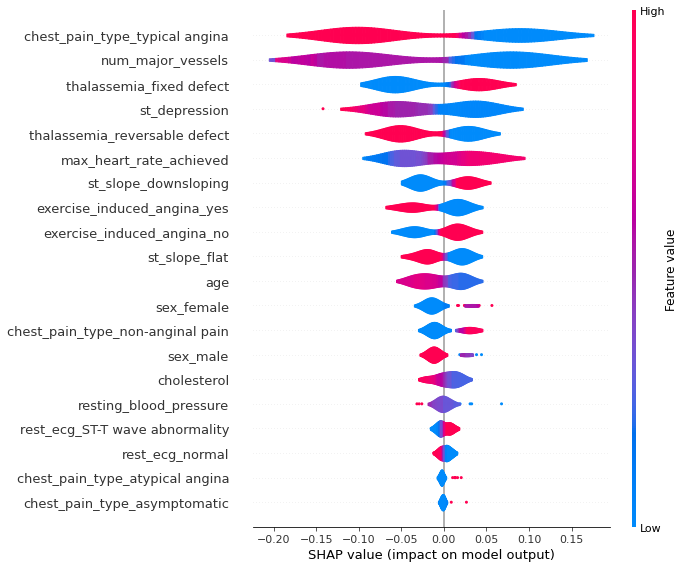

In [100]:
shap.summary_plot(shap_values[1], X_test, plot_type="violin")

* Each row represents a feature, the red color represents the data point with the higher shap value on this feature, and the blue value represents the data point with the lower shap value on this feature.

* The points to the right indicate the higher the positive influence of this feature on the prediction of unhealty.

* The larger the **num_major_vessels**, the smaller positive contribution to the outcome predicted as "unhealty".

* The greater the **max_heart_rate_achieved**, the greater the positive contribution to the outcome predicted as "unhealthy".

In [102]:
idx = 126

patient = X.iloc[idx,:]
patient_df = X.loc[idx:idx]
model_predict_proba = model.predict_proba(patient_df)[0][1]
print('{}号病人的真实标签是 {} ，模型预测为 {:.2f} '.format(idx, bool(y_test[idx]), model_predict_proba))

shap_values_patient = explainer.shap_values(patient)
shap.force_plot(explainer.expected_value[1], shap_values_patient[1], patient)

126号病人的真实标签是 True ，模型预测为 0.77 


In [104]:
number_show = 60
shap_values_summary = explainer.shap_values(X_train.iloc[:number_show])
shap.force_plot(explainer.expected_value[1], shap_values_summary[1], X_test.iloc[:number_show])